#### 주성분 분석(PCA : Pricipal Component Analysis)
: 고차원의 데이터를 저차원의 데이터로 환원시키는 방법이다.
- Principle : 근본적인
- 고차원 : 컬럼이 많다 / 저차원 : 컬럼이 적다
- 컬럼을 줄여서 원본과 비교하였을 때 데이터의 정답률이 비슷한 경우.

In [1]:
import numpy as np

In [5]:
fruits = np.load('../Data/fruits.npy')
fruits.shape
# Demension, Row, Column - 데이터의 shape를 보고 판단한다

(300, 100, 100)

In [6]:
# 머신러닝에서는 3차원 데이터를 사용할 수 없으므로 2차원 데이터로 변경해야 함
fruits_2d = fruits.reshape(-1, 100*100)
fruits_2d.shape

(300, 10000)

---
#### PCA 모델 구성하기
- 상관계수를 활용하여 데이터 컬럼 간의 관계를 판단하고, 추가적인 확인이 필요한 경우 PCA를 진행함

In [7]:
from sklearn.decomposition import PCA

In [8]:
# instance 생성
pca = PCA(n_components=50)
# 300개의 데이터 중 확실한 Feature의 특징으로 포함한 주성분 50개만 선택 - n_components
pca.fit(fruits_2d)

,n_components,50
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [10]:
# 축소된 차우너 크기 확인하기
# 모델은 변수를 받지 않는다
pca.components_.shape

(50, 10000)

In [11]:
# 축소된 50개가 어떻게 처리되었는지 확인해보기
import matplotlib.pyplot as plt

In [12]:
# 그림을 그리기 위해서는 2차원 데이터로 바꾼 내용을 3차원 데이터로 되돌릴 필요가 있다
def draw_fruits(arr, ratio=1):
    n = len(arr)      # 샘플 개수

    # 한 줄에 10개씩 출력
    rows = int(np.ceil(n / 10))
    cols = n if rows < 2 else 10

    fig, axs = plt.subplots(
        rows,
        cols,
        figsize=(cols * ratio, rows * ratio),
        squeeze=False
    )

    for i in range(rows):
        for j in range(cols):
            if i * 10 + j < n:
                axs[i, j].imshow(arr[i * 10 + j], cmap='gray_r')
            axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()

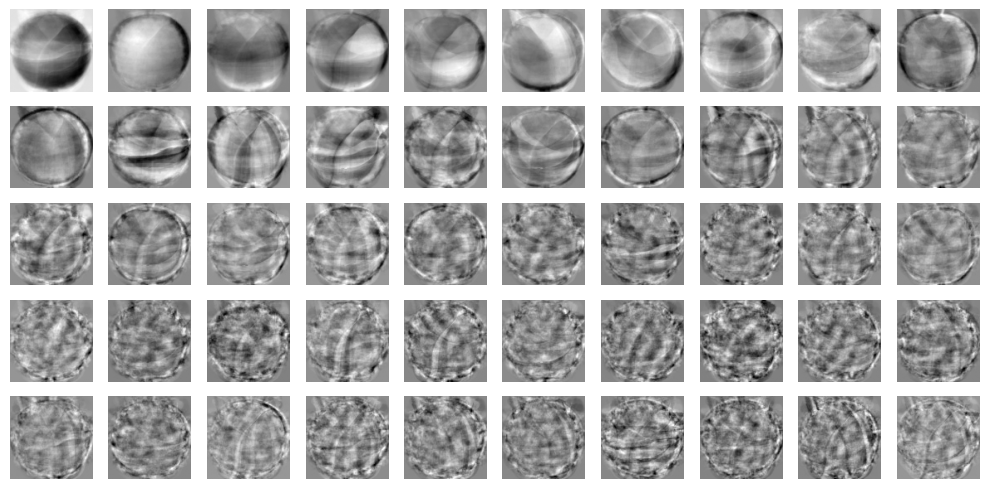

In [13]:
# feature를 3차원 배열로 바꿔야 그림을 그릴 수 있음
draw_fruits(pca.components_.reshape(-1, 100, 100))

In [18]:
# 행의 갯수는 원본가 동일하게 하고 Feature의 특성을 50개의 주 성분으로 변경
# 데이터 열의 갯수를 줄임
print(fruits_2d.shape)
fruits_pca = pca.transform(fruits_2d)
print(fruits_pca.shape)

(300, 10000)
(300, 50)


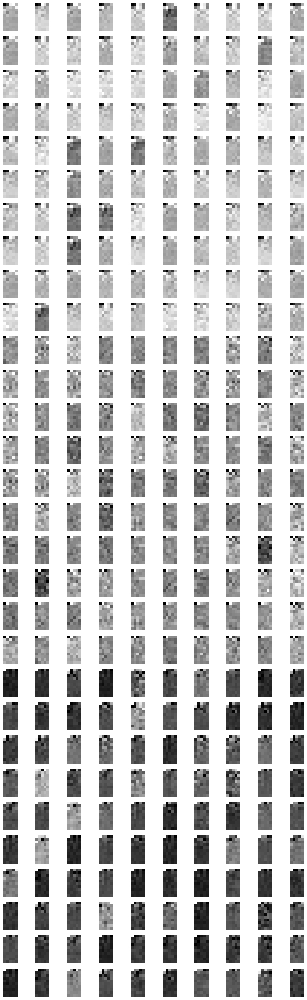

In [19]:
draw_fruits(fruits_pca.reshape(-1, 10, 5))

---
#### 원본 데이터 재구성

In [ ]:
# 원본 형태로 재구성 inverse_transform
fruits_inverse = pca.inverse_transform(fruits_pca)

In [23]:
print(fruits_inverse.shape)

(300, 10000)


In [24]:
# 그림을 그리기 위해 2차원 확장
fruits_reconstruct = fruits_inverse.reshape(-1, 100, 100)
fruits_reconstruct.shape

(300, 100, 100)

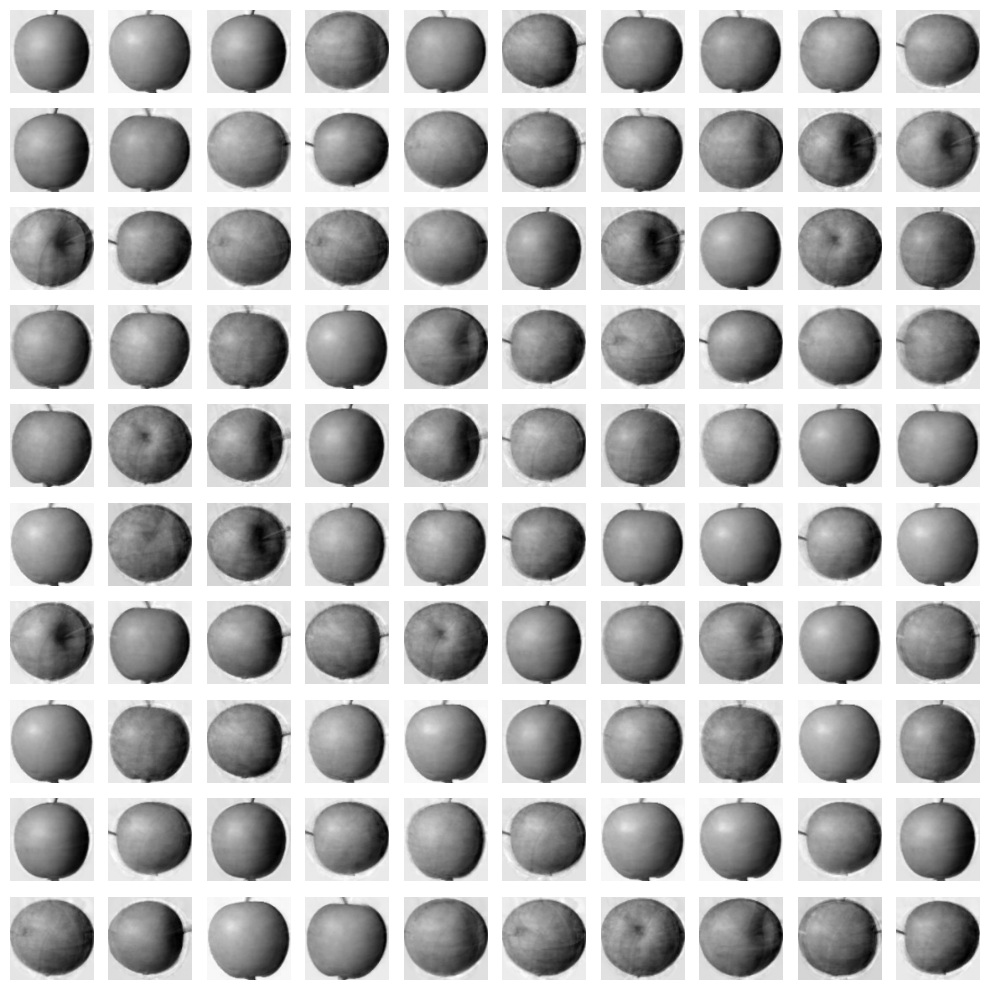

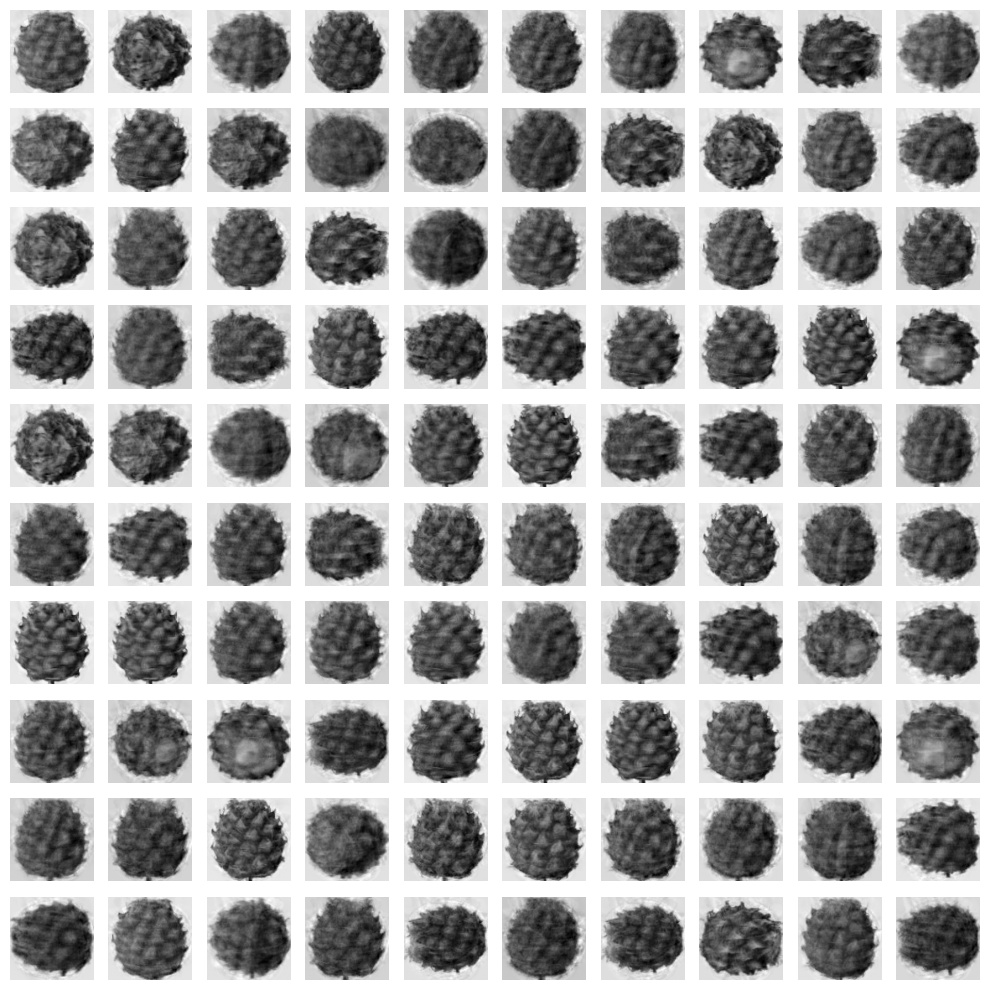

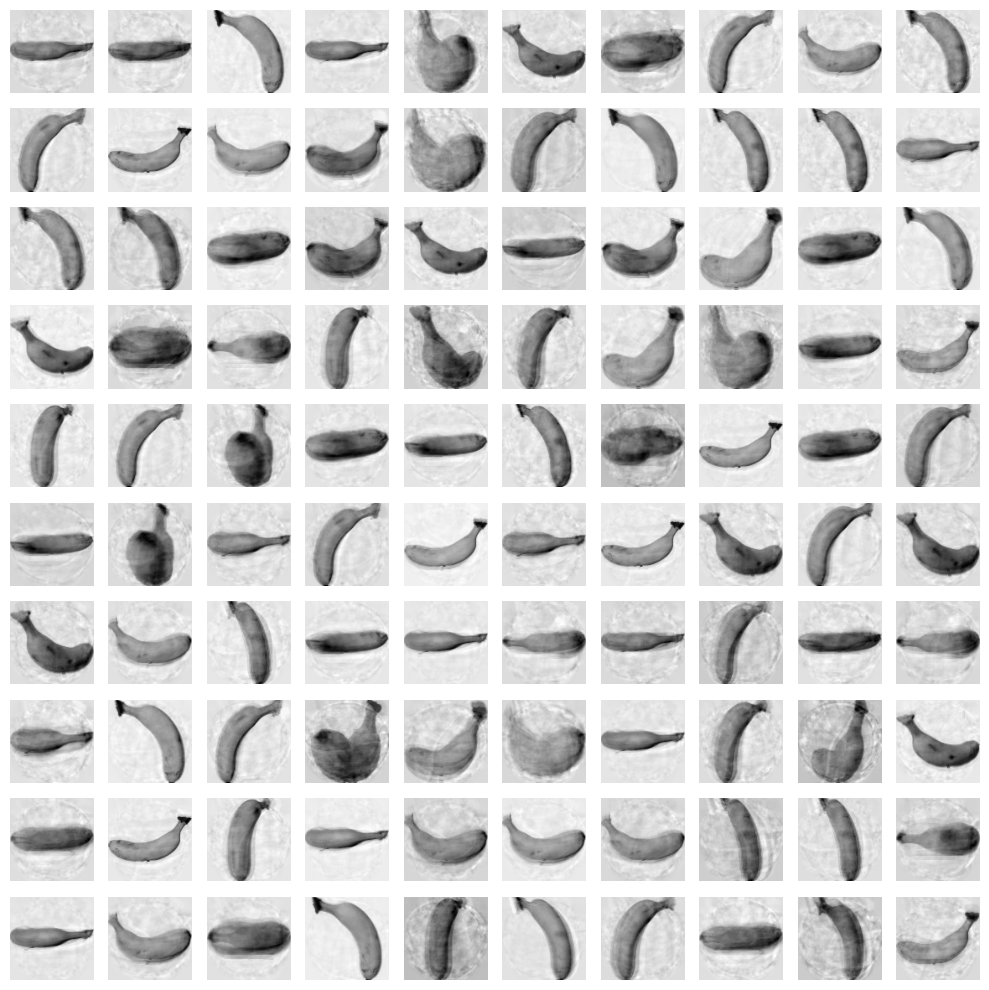

In [26]:
for start in [0, 100, 200]:
    draw_fruits(fruits_reconstruct[start:start+100])
    print("\n")

> 1/200의 데이터 특성만 가지고도 전반적으로 배경은 깨끗하지 않으나 물체의 구분은 가능하다.

----
#### 설명된 분산
: 주 성분으로 구성할 때, 원본 데이터의 분산(퍼짐의 정도)을 어느 정도 유지하고 있는지 확인하는 방법

In [27]:
np.sum(pca.explained_variance_ratio_) # 50개의 주성분 데이터

np.float64(0.9222438326422865)

> 50개의 주성분이 전체 데이터의 92%정도의 복원은 가능하다

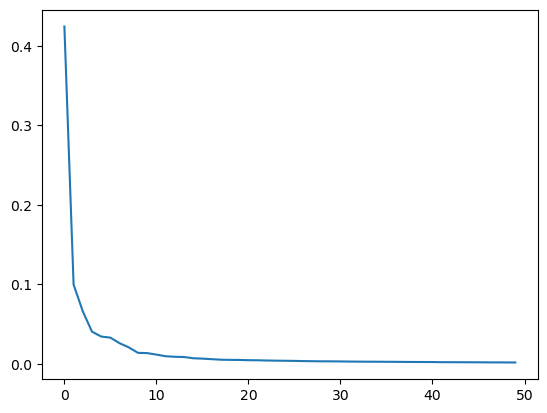

In [28]:
# 그래프 그리기
plt.plot(pca.explained_variance_ratio_)

plt.show()

> 20 ~ 50 사이는 육안으로 봤을 때 큰 차이가 발생하지 않아 데이터 수치를 더 줄이는 것이 가능하다.    
> 10도 큰 차이가 발생하지 않아 시도를 해볼 가치는 있다.

---
#### 주 성분을 10개만 선정해서 시도해보자

In [29]:
pca_10 = PCA(n_components=10)
pca_10.fit(fruits_2d)

,n_components,10
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [30]:
pca_10.components_.shape

(10, 10000)

In [31]:
fruits_pca_10 = pca_10.transform(fruits_2d)
fruits_pca_10.shape

(300, 10)

In [32]:
fruits_inverse_10 = pca_10.inverse_transform(fruits_pca_10)

In [33]:
fruits_inverse_10.shape

(300, 10000)

In [34]:
# 그림을 그리기 위해 2차원 확장
fruits_reconstruct_10 = fruits_inverse_10.reshape(-1, 100, 100)
fruits_reconstruct_10.shape

(300, 100, 100)

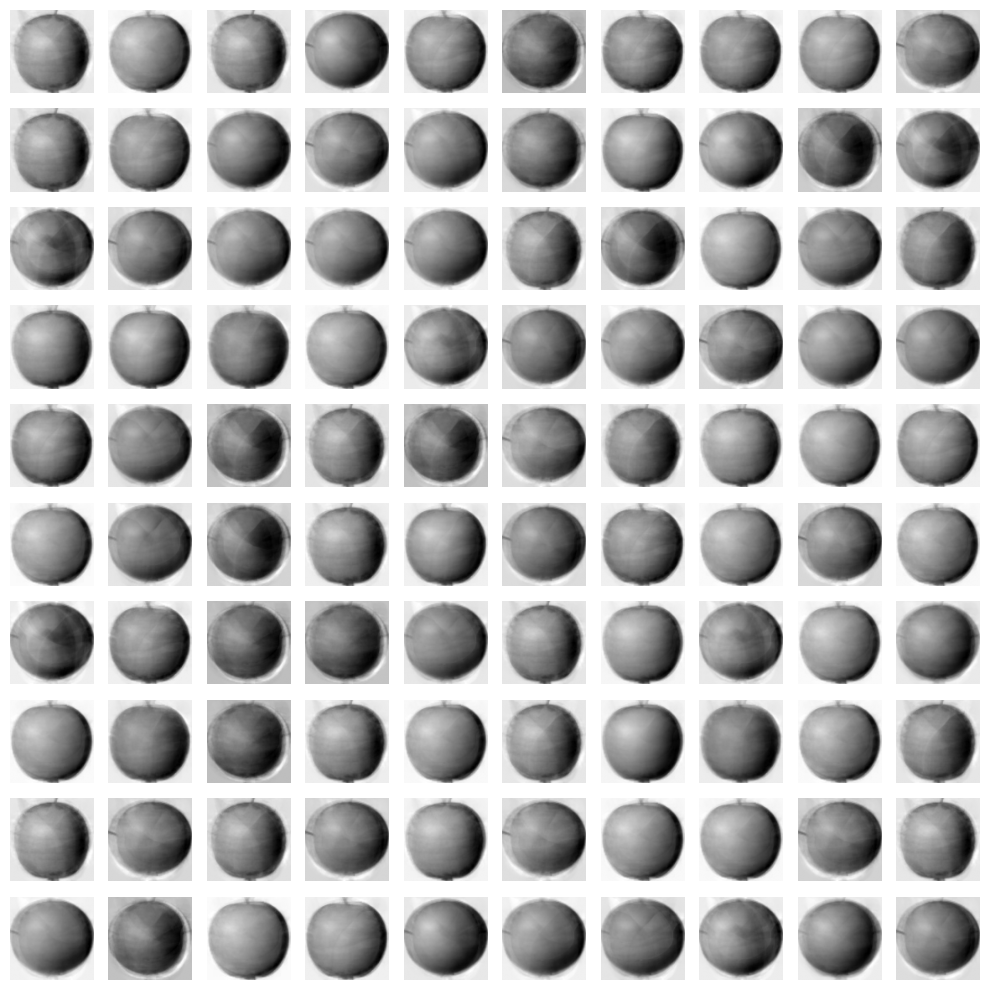

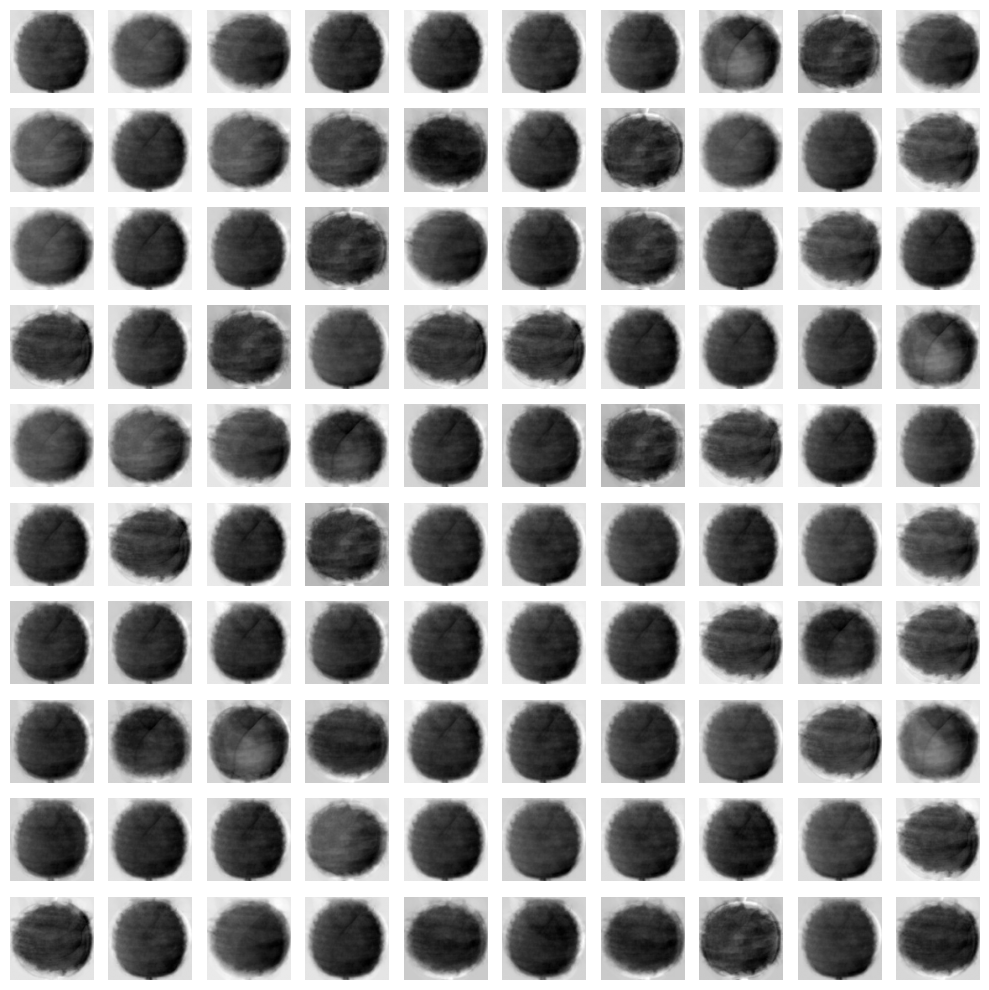

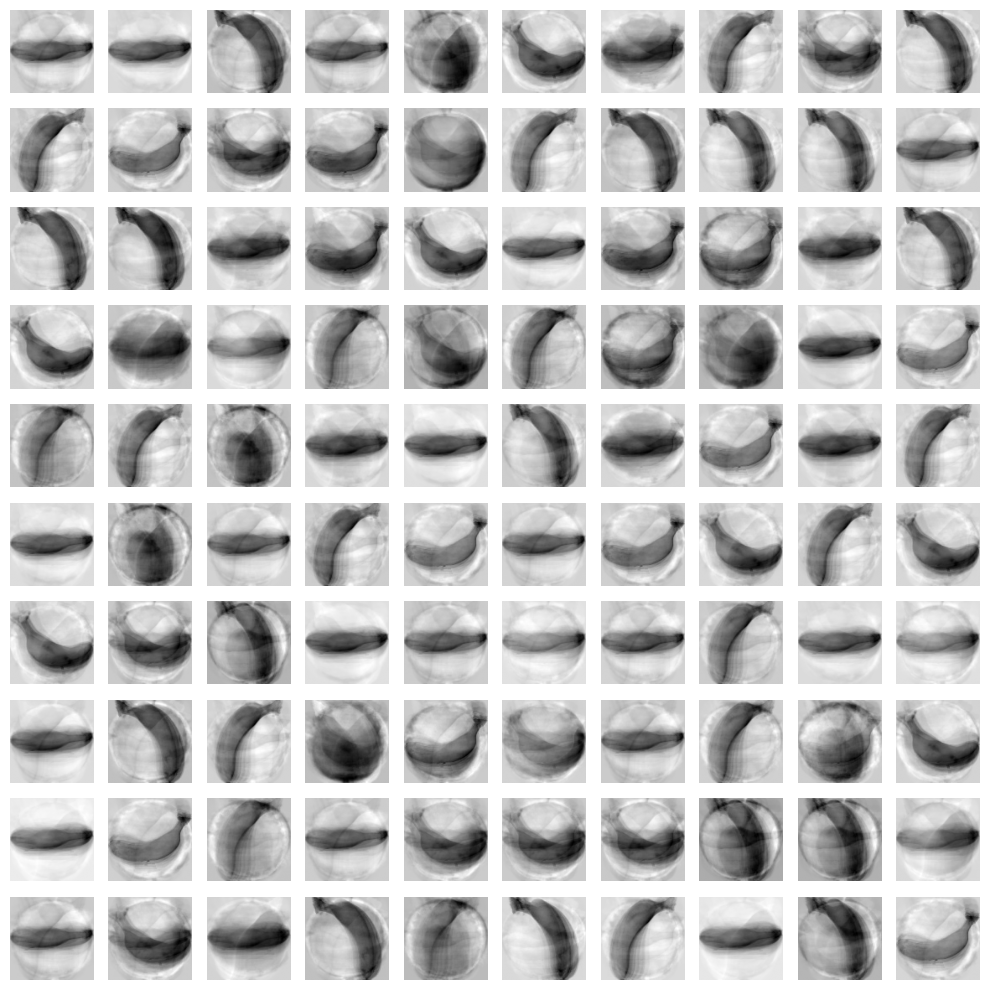

In [35]:
for start in [0, 100, 200]:
    draw_fruits(fruits_reconstruct_10[start:start+100])
    print('\n')

In [36]:
np.sum(pca_10.explained_variance_ratio_)

np.float64(0.7711096084792268)

> 안정권은 85% 이상이어야 함.

In [37]:
pca30 = PCA(n_components=30)
pca30.fit(fruits_2d)

,n_components,30
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [39]:
pca30.components_.shape

(30, 10000)

In [40]:
fruits_pca_30 = pca30.transform(fruits_2d)
fruits_pca_30.shape

(300, 30)

In [41]:
fruits_inverse_30 = pca30.inverse_transform(fruits_pca_30)
fruits_inverse_30.shape

(300, 10000)

In [42]:
fruits_reconstruct_30 = fruits_inverse_30.reshape(-1, 100, 100)
fruits_reconstruct_30.shape

(300, 100, 100)

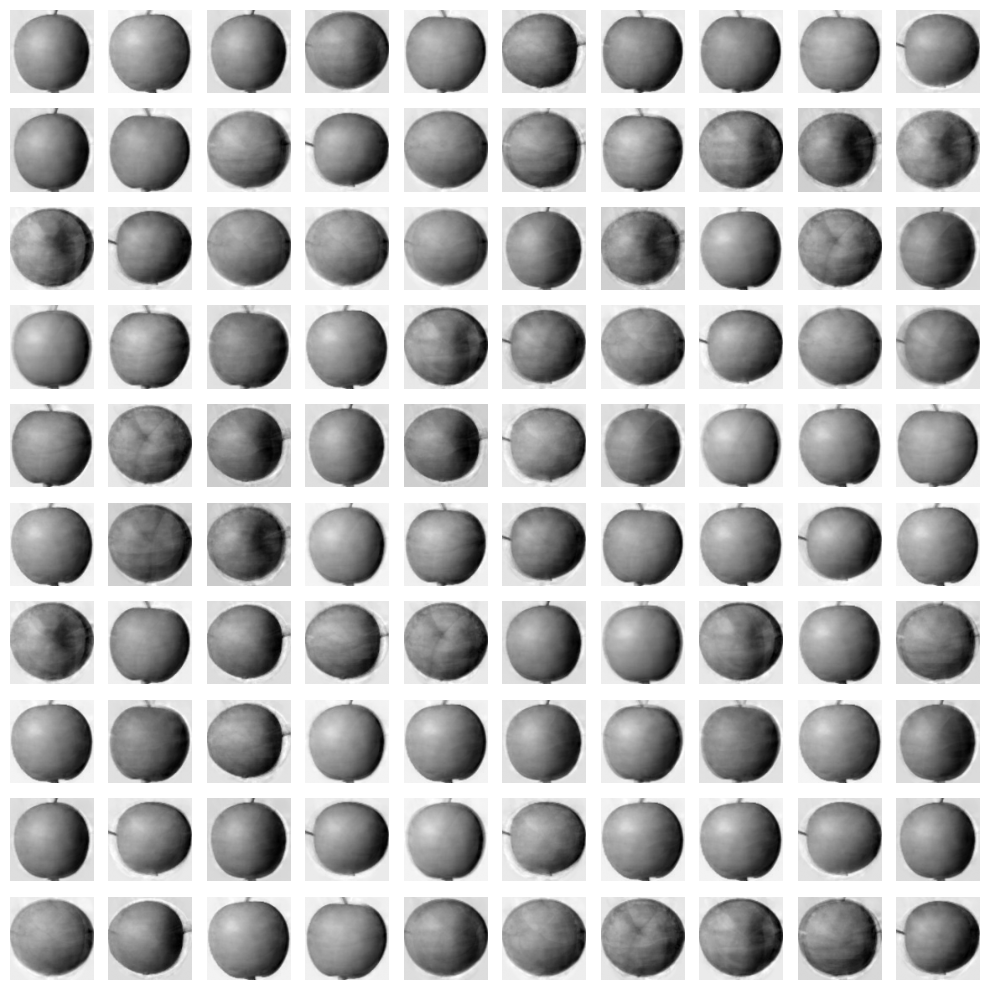

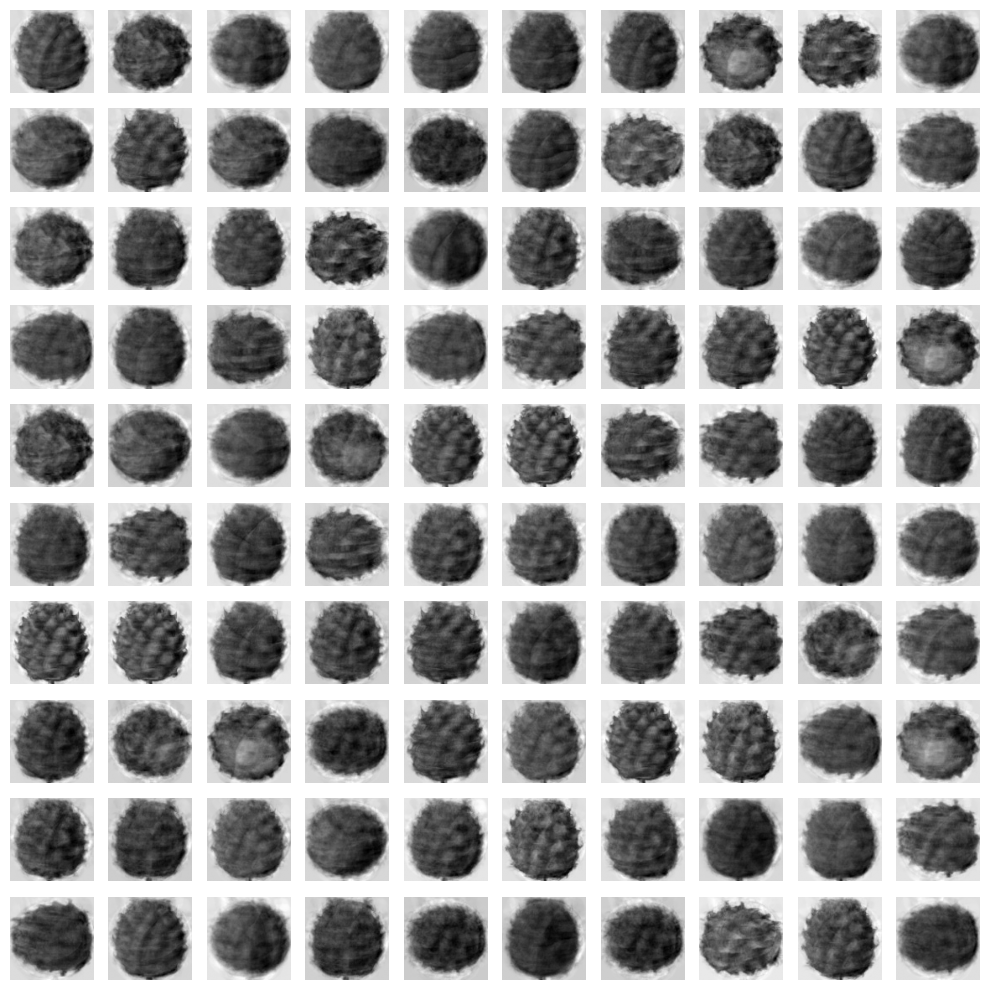

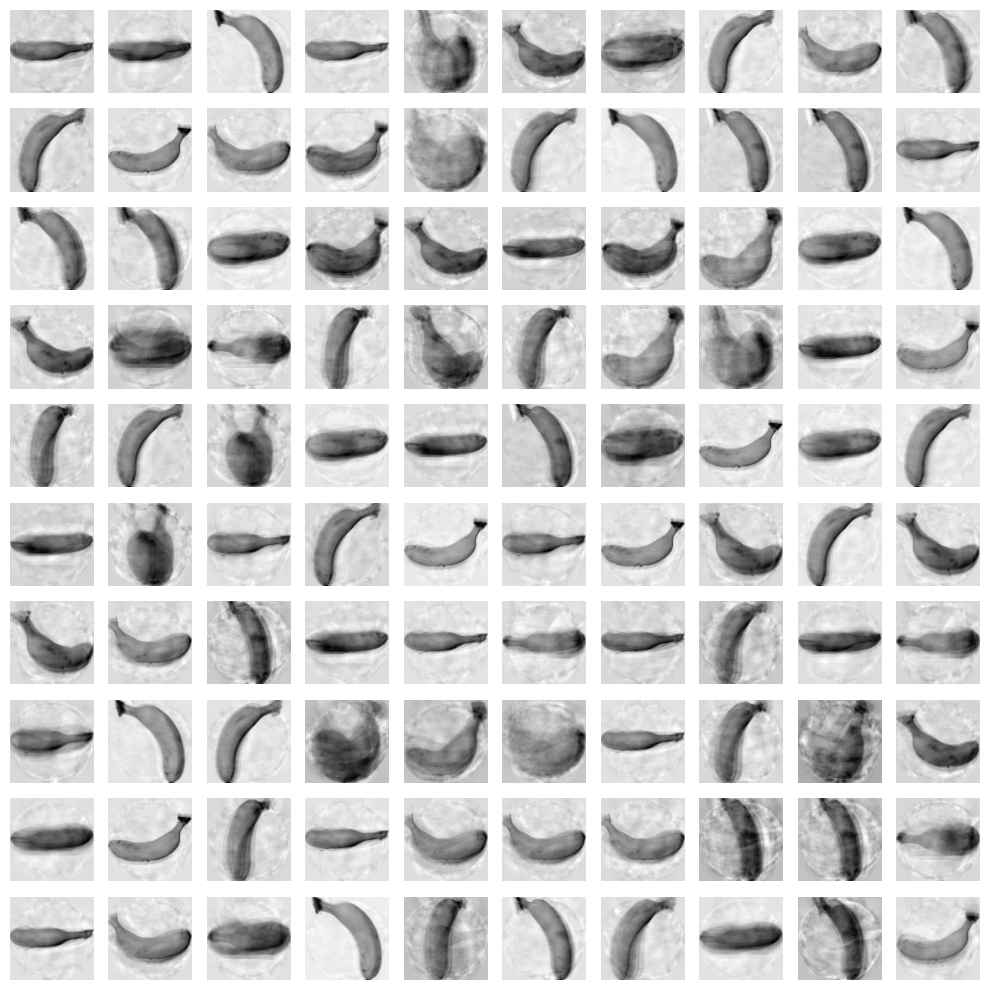

In [43]:
for start in [0, 100, 200]:
    draw_fruits(fruits_reconstruct_30[start:start+100])
    print("\n")

In [45]:
np.sum(pca30.explained_variance_ratio_)

np.float64(0.8793113146875781)

---- 
#### 로지스틱 회귀 분석에 주 성분 분석을 대입하여 사용해보기
- 이름은 "회귀"이지만 분류를 하는 방식이다

In [46]:
from sklearn.linear_model import LogisticRegression

In [47]:
lr = LogisticRegression()

In [49]:
# 로지스틱 회귀 분석은 지도학습이다 - target이 필요하다 => Target을 만들어주어야 한다
target = np.array(
    [0] * 100 +
    [1] * 100 +
    [2] * 100
)
target

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [50]:
# Train Test - Cross Validation
# Train 과 Test의 교차검증을 실시
from sklearn.model_selection import cross_validate

In [54]:
scores = cross_validate(lr, fruits_2d, target)
print(np.mean(scores['test_score']))
print(np.mean(scores['fit_time']))

0.9966666666666667
0.20837860107421874


> 정확도는 99.7% 정도이며, 계산에 필요한 시간은 0.2초 정도 나왔다.

#### 300 * 50으로 구성된 주 성분 분석으로, 구성된 데이터 확인

In [55]:
scores = cross_validate(lr, fruits_pca, target)
print(np.mean(scores['test_score']))
print(np.mean(scores['fit_time']))

0.9966666666666667
0.010248756408691407


> 정확도는 99.7% 정도이며, 계산에 필요한 시간은 0.01초 정도 나왔다.

In [56]:
scores = cross_validate(lr, fruits_pca_10, target)
print(np.mean(scores['test_score']))
print(np.mean(scores['fit_time']))

0.9966666666666667
0.00993342399597168


> 정확도는 99.7, 계산에 필요한 시간은 0.009초 나옴

---
#### 주 성분 분석의 분산 크기를 정해 사용하기

In [57]:
pca = PCA(n_components=0.5) # n_components를 실수로 정하면 분산의 percent를 기입
pca.fit(fruits_2d)

,n_components,0.5
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [60]:
pca.n_components_
# feature가 2개만 있으면 된다는 결과값을 출력함

np.int64(2)

In [61]:
fruits_pca = pca.transform(fruits_2d)
fruits_pca.shape

(300, 2)

In [62]:
scores = cross_validate(lr, fruits_pca, target)
print(np.mean(scores['test_score']))
print(np.mean(scores['fit_time']))

0.9966666666666667
0.015382957458496094


c:\Users\tuxca\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [63]:
pca = PCA(n_components=0.85) # n_components를 실수로 정하면 분산의 percent를 기입
pca.fit(fruits_2d)

,n_components,0.85
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


----
# k-Means에 주성분 분석 적용해보기

In [64]:
from sklearn.cluster import KMeans

In [65]:
km = KMeans(n_clusters=3) # 3종류로 설정
km.fit(fruits_pca)

c:\Users\tuxca\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,None
,copy_x,True
,algorithm,'lloyd'


In [67]:
np.unique(km.labels_, return_counts=True) # label = target

(array([0, 1, 2], dtype=int32), array([ 91,  99, 110]))

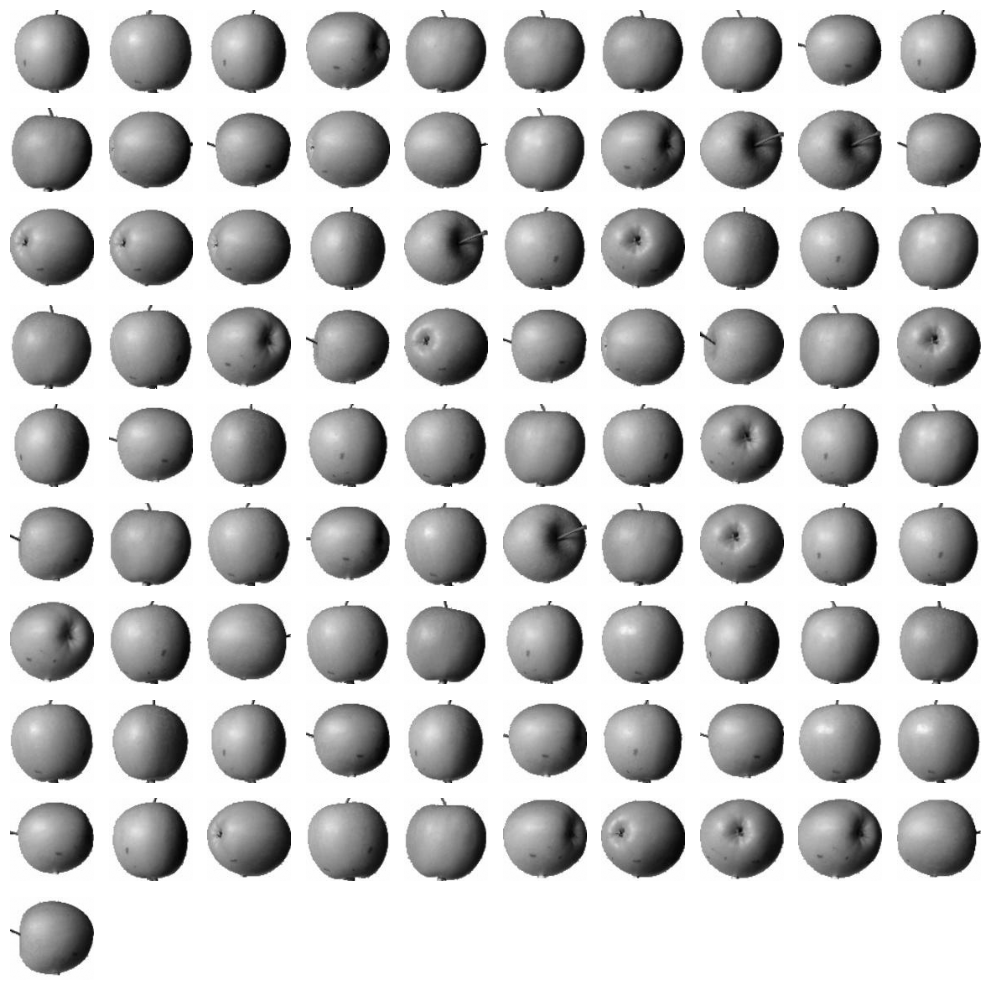

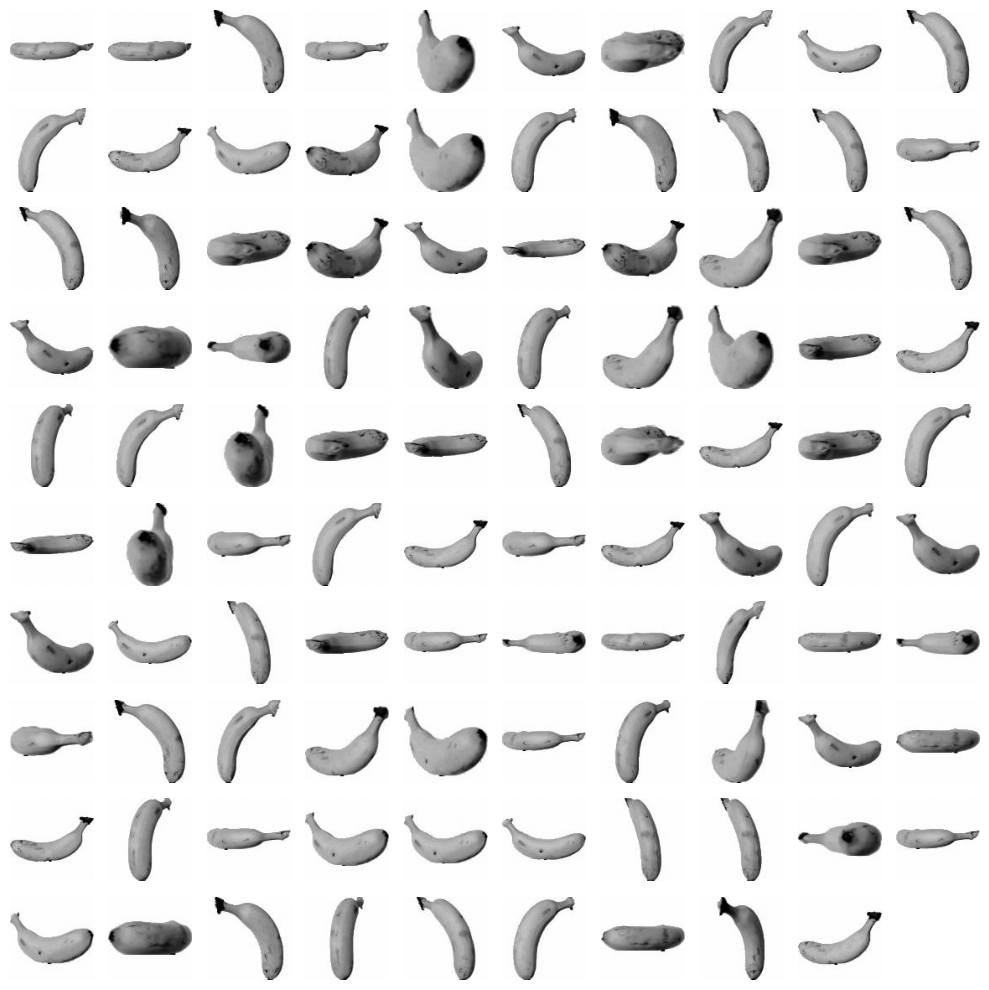

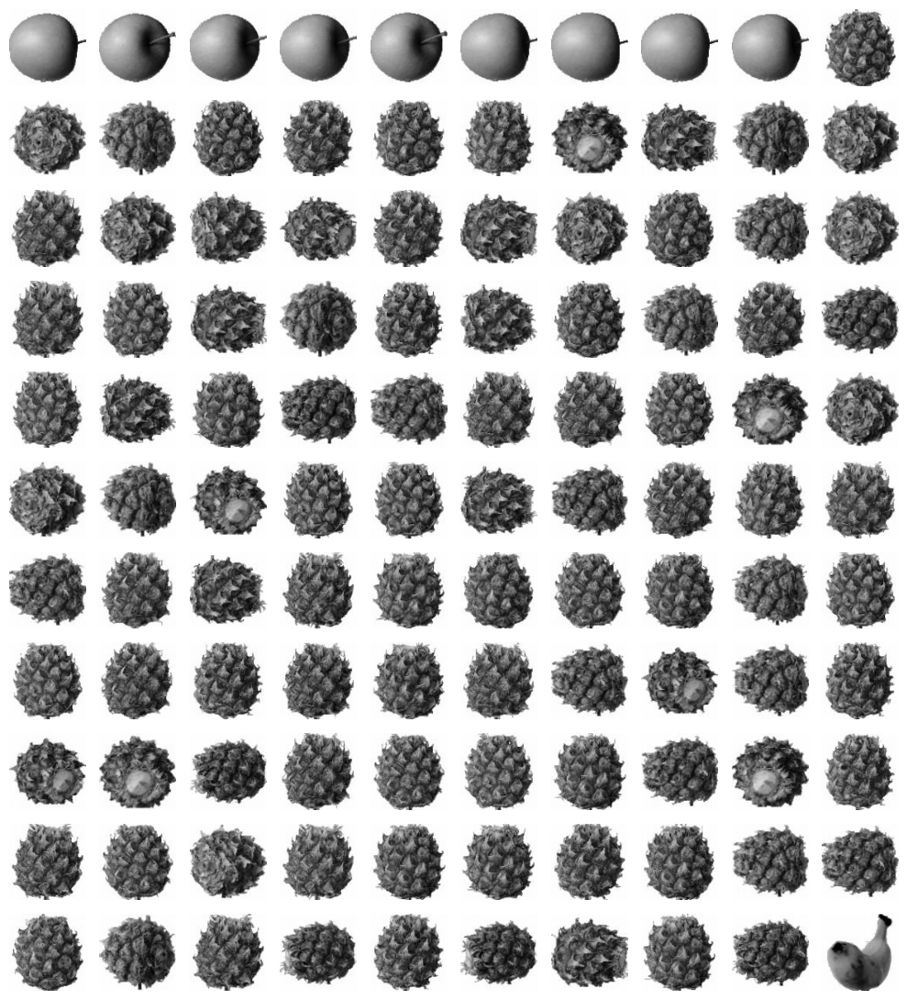

In [68]:
# 그림으로 확인하기
for label in range(0, 2+1):
    draw_fruits(fruits[km.labels_ == label])
    print('\n')

----
#### 산포도로 확인해보기

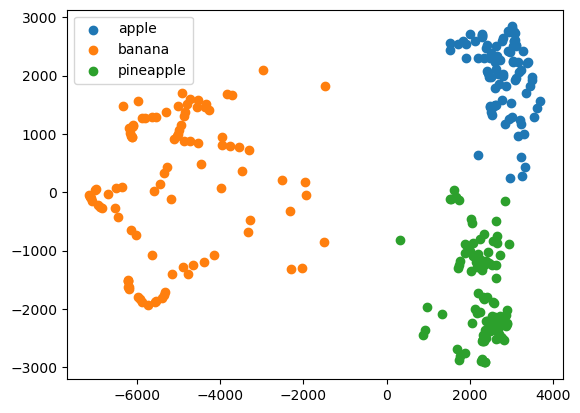

In [71]:
for label in range(0, 2+1):
    data = fruits_pca[km.labels_ == label]
    plt.scatter(data[:, 0], data[:, 1])

plt.legend(['apple', 'banana', 'pineapple'])

plt.show()

> 현재 PCA는 2개이다.
- 뚜렷한 분포가 확인 가능하다.    
- 즉, 차원이 큰 데이터의 분포를 그래프로 확인할 경우에는 주성분 분석을 활용한다.
